In [1]:
from ngram_motifs_modules import *
%matplotlib inline

mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_1.txt
4
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_2.txt
7
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_3.txt
6
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_4.txt
7
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_5.txt
3
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_6.txt
3
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_7.txt
3
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_8.txt
3
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_9.txt
5
original file

C:\Users\zangs\Anaconda2\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_12.txt
4
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_13.txt
5
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_14.txt
4
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_15.txt
3
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_16.txt
4
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_17.txt
6
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_18.txt
5
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_19.txt
4
original file: csv_version/downsample_syl_2_meta_200.csv
mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_20.txt
3
orig

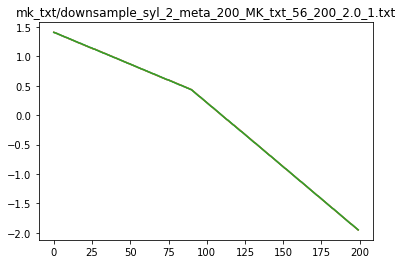

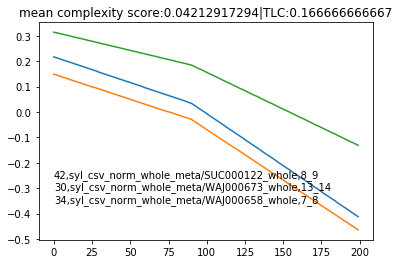

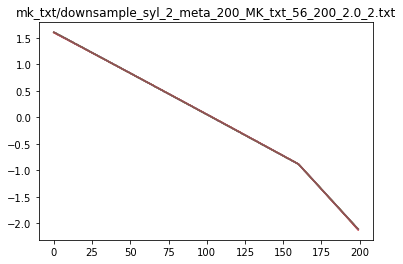

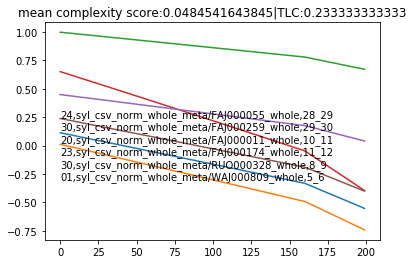

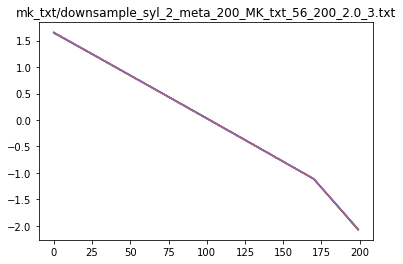

...

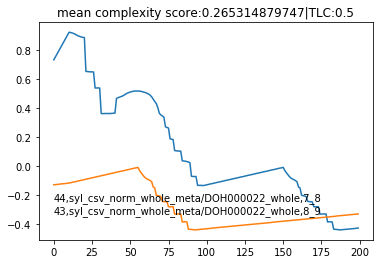

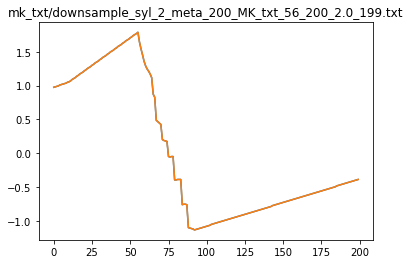

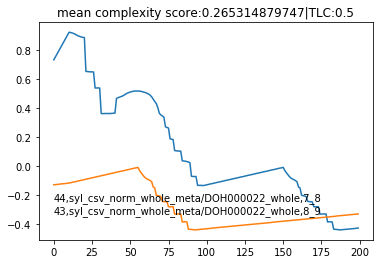

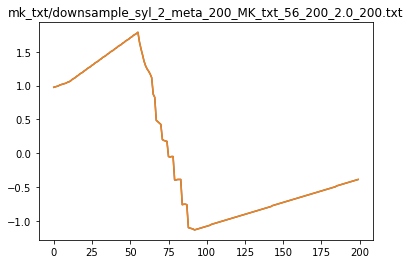

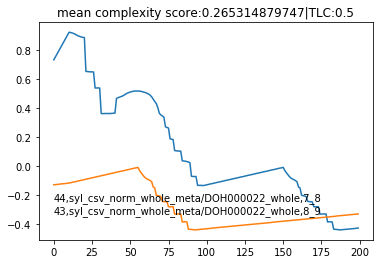

In [3]:
plot_all_motifs_meta('56',2,201,'downsample_syl_2_meta_200_MK',200,'csv_version/', 'mk_txt/')


In [6]:
linear=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,16,17,18,19,21,22,23,24,25,26,27,28,29,30,31,32,33,34,36,37,]
qlinear=[15,38,39,40,41,43,44,45,47,50,]
nonlinear=[20,42,48,49,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70]
bad=[35,46,71,72,73,74]

In [7]:
#pickle these ground truth
import pickle
pickle_file='bigram200p_gtruth.p'
ground_truth_dict={'linear':linear,'qlinear':qlinear,'nonlinear':nonlinear,'bad':bad}
pickle.dump(ground_truth_dict, open( pickle_file, "wb" ) )

## one thing to remind: there may be many aspects to analyze in ngram motif discovery. one example of an interesting aspect is how the motifs differ when sampling rate differs, 100p vs 200p, etc. (of course the data set inclusion would be different)

In [8]:
def average_complexity(motif_file):
    """compute average complexity for a motif cluster using normalized score"""
    all_mot=open(motif_file,'r').read().split('\n')
    all_comp=[]
    for line in all_mot:
        if line!='':
            l=line.strip().split(' ')
            #compute complexity score for one subsequence at a time
            data=[float(i) for i in l[1:]]
            complexity=compute_complexity(data)
            all_comp.append(complexity)
    return np.mean(all_comp),all_comp

In [9]:
In [18]: motif_file='mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_1.txt'



In [20]: new_mf='new_mk_data/downsample_syl_2_meta_100_MK_txt_52_100_2.0_1.txt'


In [10]:
#200 point bigram data
average_complexity(motif_file)

(0.25141803757315406,
 [0.25036458708451553, 0.25036458708451553, 0.25352493855043118])

In [11]:
#100 point bigram data
average_complexity(new_mf)

(0.35913693848153588,
 [0.35906715360639707,
  0.35906715360639707,
  0.3596845209708085,
  0.35890299669409276,
  0.35970647139855572,
  0.35839333461296402])

In [15]:
inds,tss100=read_motif_file(new_mf)
indss,tss200=read_motif_file(motif_file)

In [41]:
print 0.25/200, 0.35/100

0.00125 0.0035


In [17]:
print compute_complexity(tss100[0])
print compute_complexity(tss200[0])

0.359067153606
0.250364587085


In [18]:
print np.std(tss100[0]), np.std(tss200[0])

1.0000000147 0.99999999681


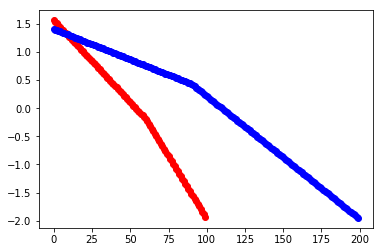

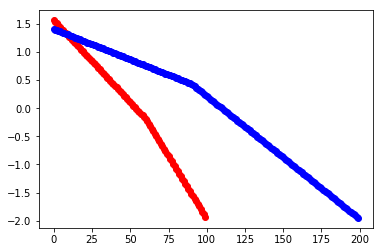

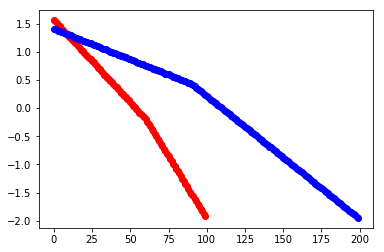

In [25]:
for i in range(3): 
    plt.figure()
    plt.plot(tss100[i],'or')
    plt.plot(tss200[i],'ob')

In [31]:
all_diff=[]
for i in range(len(tss100[0])-1):
    all_diff.append(tss100[0][i]-tss100[0][i+1])

In [32]:
print all_diff

[0.031504999999999894, 0.026254999999999917, 0.031506000000000034, 0.02625500000000014, 0.031504999999999894, 0.026254999999999917, 0.031506000000000034, 0.02625500000000014, 0.03150599999999981, 0.026254, 0.031506000000000034, 0.02625500000000014, 0.031506000000000034, 0.026254, 0.03150599999999981, 0.02625500000000014, 0.031506000000000034, 0.031504999999999894, 0.026254999999999917, 0.031506000000000145, 0.026254999999999917, 0.031505000000000005, 0.02625500000000003, 0.031506000000000034, 0.02625500000000003, 0.03150599999999992, 0.026254, 0.031506000000000034, 0.031506000000000034, 0.026254999999999917, 0.031505000000000005, 0.02625500000000003, 0.031506000000000034, 0.026254999999999917, 0.031505000000000005, 0.02625500000000003, 0.031506000000000034, 0.03150599999999998, 0.026254, 0.031506000000000034, 0.026254999999999973, 0.03150599999999998, 0.031506000000000034, 0.026254, 0.03150599999999998, 0.026255, 0.031506000000000006, 0.026254, 0.031506000000000006, 0.03150600000000000

In [33]:
all_diff200=[]
for i in range(len(tss200[0])-1):
    all_diff200.append(tss200[0][i]-tss200[0][i+1])

In [34]:
print all_diff200

[0.010950000000000015, 0.010950999999999933, 0.010950000000000015, 0.010950000000000015, 0.010950999999999933, 0.010950000000000015, 0.010950000000000015, 0.010950000000000015, 0.010950999999999933, 0.010950000000000015, 0.010950000000000015, 0.010950999999999933, 0.010950000000000015, 0.010950000000000015, 0.010951000000000155, 0.010949999999999793, 0.010950000000000015, 0.010950000000000015, 0.010951000000000155, 0.010950000000000015, 0.010950000000000015, 0.010950999999999933, 0.010950000000000015, 0.010950000000000015, 0.010950000000000015, 0.010950999999999933, 0.005474999999999897, 0.010950000000000015, 0.010951000000000155, 0.010950000000000015, 0.010949999999999793, 0.010950000000000015, 0.010951000000000155, 0.010950000000000015, 0.010950000000000015, 0.010950999999999933, 0.010950000000000015, 0.010949999999999904, 0.010950000000000015, 0.010951000000000044, 0.010950000000000015, 0.010950000000000015, 0.010950999999999933, 0.010950000000000015, 0.010950000000000015, 0.0109510

# defect of complexity score based on slope invariance

® Today has started with some surprising facts: if you have bigram 100p and bigram 200p, and expect to find higher complexity score in the latter, you're wrong, because bigram 200p has a much lower complexity score across all classes across board. After some digging, I realized that this is because these two are essentially the same data set but from 100 to 200 means the data is stretched so that in 200p the curve is changing rather slowly comparing to 100p. For ex, in a simple spurious motif of 100p data, on average each data point decreases  0.03 comparing to the previous point, whereas in essentially the same curve in the 200p data, the decrease is much slower of 0.01. Therefore, even though it has 100 more points the effect of slow change still trumps the length. 

While this effect tends to be more obvious in  the same data set with different sampling rate (as far as posing a challenge to automatically decide a threshold between classes), it is also a defect of the complexity measure: if we have two lines and after normalization they have intuitively the same level of complexity but simply because they have different slope, they will have very different complexity scores, which is essentially what is happening here. 

In [53]:
def normalize_zscore(a):
    return (a-np.mean(a))/np.std(a)

In [58]:
a=np.arange(1,10,0.01)

In [72]:
b=2*a+0.1
bn=normalize_zscore(b)

In [80]:
z=np.polyfit(a,cn,1)

In [77]:
np.mean(c)

2.8475000000000019

In [78]:
c=0.4*a+0.8
cn=normalize_zscore(c)

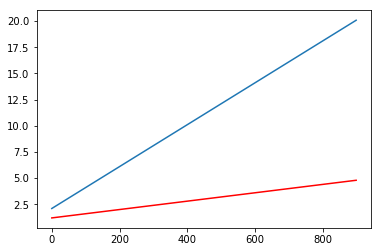

In [82]:
plt.plot(b)
plt.plot(c,'r')

In [83]:
print compute_complexity(b),compute_complexity(c)


0.599666574023 0.119933314805


In [85]:
gm_file='mk_txt/downsample_syl_2_meta_200_MK_txt_56_200_2.0_42.txt'
indg,tssg=read_motif_file(gm_file)

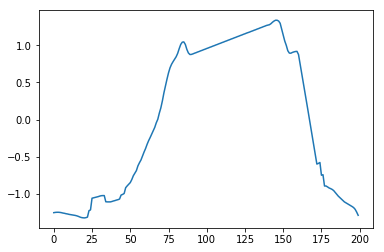

In [86]:
plt.plot(tssg[0])

In [87]:
x=range(1,201)

In [88]:
len(x)==len(tssg[0])

True

In [89]:
z=np.polyfit(x,tssg[0],1)

In [90]:
z

array([ 0.0063258 , -0.63574326])

In [94]:
p = np.poly1d(z)

In [95]:
yp=p(np.array(x))

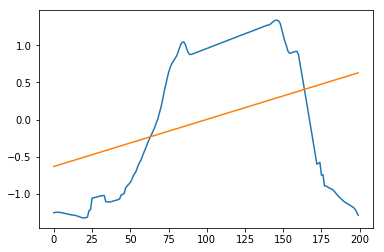

In [97]:
plt.plot(tssg[0])
plt.plot(yp)

In [99]:
len(yp)==len(tssg[0])

True

In [105]:
all_diff=[]
for i in range(len(yp)):
    diff=(yp[i]-yo[i])**2
    all_diff.append(diff)
np.sqrt(np.sum(all_diff))

13.165237510738281

In [101]:
yo=np.array(tssg[0])

In [108]:
square_error(yp,yo)

13.165237510738281

In [109]:
def square_error(a,b):
    return np.sqrt(np.sum((a-b)**2))


def complexity_polyfit(ts):
    x=range(1,len(ts)+1)
    ts=np.array(ts)
    z=np.polyfit(x,ts,1)
    p = np.poly1d(z)
    y_pred=p(x)
    err=square_error(y_pred,ts)
    return err

In [116]:
complexity_polyfit(tss200[1])

2.2203334927406635